# Merging of experiments & models into one file & analysing of initial states (area & volume) for different experiments, GCMs & models:

- merges all regional glacier runs of the different models into one netCDF file 
    - option A: volume/area scaling applied so that all models start at the same initial state:
        - https://cluster.klima.uni-bremen.de/~lschuster/glacierMIP3_analysis/glacierMIP3_mar14_models_all_rgi_regions_sum_scaled.nc
    > current things to clarify: there are some rounding / preprocessing differences between initial volume/area  in Farinotti (table) and the "OGGM" estimates (for more informations, ask Lilian & Fabien). Here, we scale to the OGGM reference volume and area initial states that were estimated by the raw Farinottti estimates. If wished, we could change it to scale instead to the rounded, slightly different Farinotti table values.
    - same as A, but in option B no volume/area scaling applied (just interesting for testing, understanding the models workflow)
        - https://cluster.klima.uni-bremen.de/~lschuster/glacierMIP3_analysis/glacierMIP3_mar14_models_all_rgi_regions_sum.nc
        
        
- also plots amount of experiments per glacier model and checks initial state before having applied volume/area scaling
        


In [1]:
DATE = 'Feb12_2024'

In [2]:
# import some packages that we need later
import xarray as xr
import numpy as np
import pandas as pd
import os
import glob
import seaborn as sns
import matplotlib.pyplot as plt
import oggm
import geopandas as gpd


In [3]:
# Define experiments 
gcms = ['gfdl-esm4', 'ipsl-cm6a-lr', 'mpi-esm1-2-hr', 'mri-esm2-0', 'ukesm1-0-ll' ]
scenarios = ['hist', 'ssp126', 'ssp370', 'ssp585']
y0_times = [1851, 1901, 1951, 1995, 2021, 2041, 2061, 2081]

# get the RGI area / ITMIX volumes of the glaciers
rgi_regs = []
for rgi_reg in np.arange(1,20,1):
    if rgi_reg < 10:
        rgi_reg = '0'+str(rgi_reg)
    else:
        rgi_reg = str(rgi_reg)
    rgi_regs.append(rgi_reg)
df_itmix = pd.read_hdf(oggm.utils.get_demo_file('rgi62_itmix_df.h5'))

rgidf_dict = {}
for rgi_reg in rgi_regs:
    path_rgi = oggm.utils.get_rgi_region_file(rgi_reg, version='6')
    rgidf = gpd.read_file(path_rgi)
    # Greenland periphery : all glaciers with connectivity level 0 and 1 should be included, level 2 glaciers should be excluded (as was the case for GlacierMIP2)
    # total RGI area: 89,651km2
    if rgi_reg == '05':
        rgidf = rgidf.loc[(rgidf['Connect'] == 0) | (rgidf['Connect'] ==1)]
    rgidf_dict[rgi_reg] = rgidf
    rgidf_dict[rgi_reg] = rgidf_dict[rgi_reg].set_index('RGIId')

path_rgi = oggm.utils.get_rgi_region_file('05', version='6')
rgidf = gpd.read_file(path_rgi)
rgidf_c = rgidf.loc[(rgidf['Connect'] == 0) | (rgidf['Connect'] ==1)]
n_excluded = len(rgidf) - len(rgidf_c)
print(f'amount of glaciers excluded in RGI region 05 because they are connectivity level 2: {n_excluded}')

amount of glaciers excluded in RGI region 05 because they are connectivity level 2: 955


In [4]:
def get_path(folder_path='/home/www/lschuster/glacierMIP3_analysis',
             rgi_reg='01',
             model_author='PyGEM-OGGM_v13',
             period='1851-1870', gcm='gfdl-esm4', ssp='hist'):
    ''' output the regional simulation file path for the respective
    rgi_reg, model_author, period, gcm & ssp '''
    if (model_author == 'PyGEM-OGGM_v13'):
        model_author_file = 'Rounce'
        path = f'{folder_path}/{model_author}/regional-filled-norunaway/{rgi_reg}/{model_author_file}_rgi{rgi_reg}_sum_{period}_{gcm}_{ssp}.nc'
    elif ('OGGM' in model_author):
        # was corrected for missing glaciers ... (by Lilian Schuster with method of Fabien)
        model_author_f = model_author
        if 'OGGM' in model_author and ssp == 'hist':
            ssp = 'historical'
            path =  f'{folder_path}/{model_author_f}/regional_filled/{rgi_reg}/{model_author}_rgi{rgi_reg}_sum_{period}_{gcm}_{ssp}_filled.nc'
        else:
            path =  f'{folder_path}/{model_author_f}/regional_filled/{rgi_reg}/{model_author}_rgi{rgi_reg}_sum_{period}_{gcm}_{ssp}_filled.nc'
    else:
        if gcm=='ipsl-cm6a-lr':
            if model_author=='GloGEMflow':
                gcm='psl_cm6a-lr' # no 'i' and '_' instead of '-'
            if model_author == 'Huss':
                # also Huss has some spelling issues
                gcm = 'ipsl_cm6a-lr'
        if model_author=='Kraaijenbrink' or model_author=='GO':
            if ssp == 'hist':
                ssp='historical'
        if model_author == 'GloGEMflow3D':
            model_author_file = 'Zekollari'
            if ssp == 'hist':
                ssp = 'ssp126'
        else:
            model_author_file = model_author
        path = f'{folder_path}/{model_author}/{model_author_file}_rgi{rgi_reg}_sum_{period}_{gcm}_{ssp}.nc'
    return path
#path = get_path(rgi_reg=rgi_reg, model_author='OGGM_v153', period=period, gcm='gfdl-esm4', ssp=scenario)
#path = get_path(rgi_reg=rgi_reg, model_author='OGGM_v16', period=period, gcm=gcm, ssp=scenario)
#xr.open_dataset(path)

In [5]:
def scale_area_vol(ds, rgi_reg='01'):
    rgis = rgidf_dict[rgi_reg].index.values
    vol_scaling = df_itmix.loc[rgis]['vol_itmix_m3'].sum() / ds.volume_m3.isel(simulation_year=0)
    ds['volume_m3'] = ds.volume_m3 * vol_scaling
    area_scaling = (rgidf_dict[rgi_reg]['Area'].sum()*1e6) / ds.area_m2.isel(simulation_year=0)
    ds['area_m2'] = ds.area_m2 * area_scaling
    return ds

In [ ]:
# we have here all inside, although we will later not look into Huss and OGGM_v153 and OGGM-VAS
model_authors = ['CISM2','GO', 'PyGEM-OGGM_v13','GloGEMflow','Kraaijenbrink','GLIMB',
                  'OGGM_v153','OGGM_v16', 'OGGM-VAS', 'GloGEMflow3D', 'Huss'] ##'Huss',

# We need dummy datasets, because some files only go until 2000 and have to be extended then in order to be merged with the other files 
# dummy dataset ... w. 5001 entries
ds_nan_5001 = xr.open_dataset(get_path(rgi_reg='01'))
ds_nan_5001.volume_m3.data[...] = np.NaN
ds_nan_5001.area_m2.data[...] = np.NaN

# dummy dataset ... w. 2001 entries
ds_nan_2001 = xr.open_dataset(get_path(rgi_reg='02')) 
ds_nan_2001.volume_m3.data[...] = np.NaN
ds_nan_2001.area_m2.data[...] = np.NaN


# these regions should run until 5000 years:
rgi_regs_5000 = ['01', '03', '04', '05', '06','07', '09', '17','19']

run = Fa #True
if run:
    for apply_scaling in [False, True]:
        l_ds_list = []
        for model_author in model_authors: #['OGGM_v153']: #model_authors:
            print(model_author)
            missing_exp=[]
            _ds_reg = []
            for rgi_reg in rgi_regs: #'01'
                # want to have the right simulation year length
                _l_period = []
                for y0_time in y0_times[:4]:
                    period = f'{y0_time}-{y0_time+19}'
                    _l_scenario = []
                    for scenario in scenarios[:1]:
                        _l_gcm = []
                        for gcm in gcms:
                            path = get_path(rgi_reg=rgi_reg, model_author=model_author, period=period, gcm=gcm, ssp=scenario)
                            try:
                                if model_author == 'GloGEMflow' or model_author == 'Huss':
                                    _ds = xr.open_dataset(path)
                                    # wrong netcdf shape and simulation year 1 year too short ...
                                    if len(_ds.volume_m3.squeeze()) == 5000:
                                        ds = ds_nan_5001.copy(deep=True)
                                    elif len(_ds.volume_m3.squeeze()) == 2000:
                                        ds = ds_nan_2001.copy(deep=True)
                                    if model_author == 'Huss':
                                        ds.volume_m3.data[:-1] = _ds.volume_m3.squeeze() 
                                    else:
                                        ds.volume_m3.data[:-1] = _ds.volume_m3.squeeze()*1e9 # is in km3 instead of m3
                                    ds.area_m2.data[:-1] = _ds.area_m2.squeeze()
                                    # we will just fill up the last value with the second to the last value
                                    ds.volume_m3[-1] = ds.volume_m3[-2].values
                                    ds.area_m2[-1] = ds.area_m2[-2].values
                                    ds.attrs.update(_ds.attrs)
                                else:
                                    ds = xr.open_dataset(path)
                            except:
                                # in case of OGGM 11, went for 5000 yrs anyways
                                if rgi_reg in rgi_regs_5000:
                                    ds = ds_nan_5001.copy(deep=True)
                                else:
                                    ds = ds_nan_2001.copy(deep=True)
                                missing_exp.append(path)
                            if model_author == 'CISM2' and rgi_reg == '11':
                                ds.volume_m3.data = ds.volume_m3.squeeze()*1e9 # is in km3 instead of m3
                                ds.area_m2.data = ds.area_m2.squeeze()*1e6 # is in km3 instead of m3

                            ds = ds.reset_coords()[['volume_m3', 'area_m2']]
                            if apply_scaling:
                                ds = scale_area_vol(ds, rgi_reg = rgi_reg)
                            ds = ds.expand_dims({'gcm':[gcm], 'ssp':[scenario], 'period':[period], 'rgi_reg':[rgi_reg]})
                            _l_gcm.append(ds)
                        _l_scenario.append(xr.concat(_l_gcm, dim='gcm'))

                    _l_period.append(xr.concat(_l_scenario, dim='ssp'))
                ds_past = xr.concat(_l_period, dim='period')

                _l_period = []
                for y0_time in y0_times[4:]:
                    period = f'{y0_time}-{y0_time+19}'
                    _l_scenario = []
                    for scenario in scenarios[1:]:
                        _l_gcm = []
                        for gcm in gcms:
                            path = get_path(rgi_reg=rgi_reg, model_author=model_author, period=period, gcm=gcm, ssp=scenario)
                            try:
                                #if model_author == 'Compagno' and gcm=='ukesm1-0-ll' and rgi_reg == '05':
                                #    raise ValueError('duplicate values, fill with np.NaN')
                                if model_author == 'GloGEMflow' or model_author == 'Huss':
                                    _ds = xr.open_dataset(path)
                                    # wrong netcdf shape and simulation year 1 year too short ...
                                    if len(_ds.volume_m3.squeeze()) == 5000:
                                        ds = ds_nan_5001.copy(deep=True)
                                    elif len(_ds.volume_m3.squeeze()) == 2000:
                                        ds = ds_nan_2001.copy(deep=True)
                                    if model_author == 'Huss':
                                        ds.volume_m3.data[:-1] = _ds.volume_m3.squeeze() 
                                    else:
                                        ds.volume_m3.data[:-1] = _ds.volume_m3.squeeze()*1e9 # is in km3 instead of m3
                                    ds.area_m2.data[:-1] = _ds.area_m2.squeeze()
                                    ds.volume_m3[-1] = ds.volume_m3[-2].values
                                    ds.area_m2[-1] = ds.area_m2[-2].values
                                    ds.attrs.update(_ds.attrs)
                                else:
                                    ds = xr.open_dataset(path)
                            except:
                                if rgi_reg in rgi_regs_5000:
                                    ds = ds_nan_5001.copy(deep=True)
                                else:
                                    ds = ds_nan_2001.copy(deep=True)
                                missing_exp.append(path)
                            if model_author == 'CISM2' and rgi_reg == '11':
                                ds.volume_m3.data = ds.volume_m3.squeeze()*1e9 # is in km3 instead of m3
                                ds.area_m2.data = ds.area_m2.squeeze()*1e6 # is in km3 instead of m3
                            ds = ds.reset_coords()[['volume_m3', 'area_m2']]
                            if apply_scaling:
                                ds = scale_area_vol(ds, rgi_reg = rgi_reg)
                            ds = ds.expand_dims({'gcm':[gcm], 'ssp':[scenario], 'period':[period], 'rgi_reg':[rgi_reg]})
                            _l_gcm.append(ds)
                        _l_scenario.append(xr.concat(_l_gcm, dim='gcm'))
                    _l_period.append(xr.concat(_l_scenario, dim='ssp'))
                ds_future = xr.concat(_l_period, dim='period')
                _ds_reg_single = xr.concat([ds_past, ds_future], dim = 'ssp')
                # make sure that simulation_year is a coordinate
                _ds_reg_single.coords['simulation_year'] = _ds_reg_single.simulation_year
                _ds_reg.append(_ds_reg_single)
            ds = xr.concat(_ds_reg, dim='rgi_reg')

            _ds_mod = ds.expand_dims({'model_author':[model_author]})
            l_ds_list.append(_ds_mod)

        ds_reg_models = xr.concat(l_ds_list, dim='model_author')

        # This is the same for all files
        encoding = {
            'simulation_year': {"dtype": "int16"},
            'volume_m3': {"dtype": "float32"},
            'area_m2': {"dtype": "float32"},
        }

        ds_reg_models = ds_reg_models.stack(period_scenario = ('period', 'ssp'))
        ds_reg_models.coords['period_scenario'] = [a[0]+'_'+a[1] for a in ds_reg_models.period_scenario.values]

        l_period_ssp = ['1851-1870_hist', '1901-1920_hist', '1951-1970_hist',
           '1995-2014_hist',  '2021-2040_ssp126',
           '2021-2040_ssp370', '2021-2040_ssp585', 
           '2041-2060_ssp126', '2041-2060_ssp370', '2041-2060_ssp585',
           '2061-2080_ssp126', '2061-2080_ssp370',
           '2061-2080_ssp585', '2081-2100_ssp126',
           '2081-2100_ssp370', '2081-2100_ssp585']

        ds_reg_models = ds_reg_models.sel(period_scenario = l_period_ssp)

        if apply_scaling:
            out_path = f'/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled.nc'
        else:
            out_path = f'/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_{DATE}_models_all_rgi_regions_sum.nc'

        # put NaN into the duplicated file 
        #ds_reg_models.sel(model_author='Compagno').sel(rgi_reg='05').sel(gcm='ukesm1-0-ll').volume_m3.data[:,:] = np.NaN
        #ds_reg_models.sel(model_author='Compagno').sel(rgi_reg='05').sel(gcm='ukesm1-0-ll').area_m2.data[:,:] = np.NaN
                
        # remove 0 from RGI region 17 
        ind_model_author = np.where((ds_reg_models.model_author=='Huss').to_dataframe().reset_index(drop=True))[0][0]
        ind_rgi_reg = np.where((ds_reg_models.rgi_reg=='17').to_dataframe().reset_index(drop=True))[0][0]
        ds_reg_models.volume_m3.data[ind_model_author,:,ind_rgi_reg, 2000:5001,:] = np.NaN
        ds_reg_models_sel = ds_reg_models.sel(rgi_reg='17')
        assert len(ds_reg_models_sel.sel(simulation_year=2000).volume_m3.where(ds_reg_models_sel.sel(simulation_year=2000).volume_m3==0).dropna(dim='model_author', how='all').model_author) == 0
        assert len(ds_reg_models_sel.sel(simulation_year=5000).volume_m3.where(ds_reg_models_sel.sel(simulation_year=5000).volume_m3==0).dropna(dim='model_author', how='all').model_author) == 0
        ds_reg_models.attrs = {} # this needs to be filled with some informations, but for know leave it empty 
        ds_reg_models.to_netcdf(out_path, encoding = encoding)
else:
    #out_path = '/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_sep16_models_all_rgi_regions_sum.nc'
    #out_path = '/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_feb07_models_all_rgi_regions_sum.nc'
    # DATE = 'apr04'
    out_path = f'/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled.nc'

    ds_reg_models = xr.open_dataset(out_path)

CISM2
GO
PyGEM-OGGM_v13
GloGEMflow
Kraaijenbrink
GLIMB
OGGM_v153
OGGM_v16
OGGM-VAS


In [ ]:
ds_reg_models.sel(model_author='GloGEMflow3D').dropna(dim='rgi_reg', how='all').sel(simulation_year=5000).dropna(dim='rgi_reg')

In [ ]:
assert ds_reg_models.sel(model_author='CISM2').sel(rgi_reg='11').volume_m3.isel(simulation_year=0).std()/ds_reg_models.sel(model_author='CISM2').sel(rgi_reg='11').volume_m3.isel(simulation_year=0).max() < 1e-4

#### Ok, there are some rounding errors in Farinotti et al., (2019)
- at the moment we scale to the real data, we could also do that differently  

In [ ]:
for r in rgidf_dict.keys():
    print(r)
    t=oggm.utils.get_rgi_region_file(r, version='6')
    print(gpd.read_file(t)['Area'].sum())
    print(gpd.read_file(t)['Area'].count())

In [ ]:
t=oggm.utils.get_rgi_region_file('10', version='6')
gpd.read_file(t)['Area'].sum()

In [ ]:
t=oggm.utils.get_rgi_region_file('02', version='6')
gpd.read_file(t)['Area'].sum()  # vs 14,629

In [ ]:
ds_reg_models.sel(model_author='GLIMB').sel(rgi_reg='02').area_m2.isel(simulation_year=0)


In [ ]:
ind_reg={}
for r in rgidf_dict.keys():
    ind_reg[r] = []
    for ind in df_itmix.index:
        if '-'+r+'.' in ind:
            ind_reg[r].append(ind)

In [ ]:
for r in rgidf_dict.keys():
    vol = df_itmix.loc[ind_reg[r]]['vol_itmix_m3'].sum()
    n = df_itmix.loc[ind_reg[r]]['vol_itmix_m3'].count()
    print(r, n, (vol/1e9).round(2))

In [ ]:
for r in rgidf_dict.keys():
    df_itmix.index

### First analysis plots:

In [9]:
from help_functions import pal_models, model_order, d_reg_num_name, model_order_anonymous
hue_order_anonymous = []
#hue_order = model_order[:-2] # remove OGGM_v153 and Huss
#pal_models = pal_models[:-2]

pal_models_l = []
hue_order = []
for m, p in zip(model_order, pal_models):
    if (m!='OGGM-VAS') and (m!='OGGM_v153') and (m!='Huss'):
        hue_order.append(m)
        pal_models_l.append(p)
for m in hue_order:
    hue_order_anonymous.append(model_order_anonymous[m])
pal_models = pal_models_l

print(hue_order, hue_order_anonymous)
# select the right models:
ds_reg_models = ds_reg_models.sel(model_author = hue_order)
pal_models = sns.color_palette(pal_models)
pal_models


['PyGEM-OGGM_v13', 'GloGEMflow', 'GloGEMflow3D', 'OGGM_v16', 'GLIMB', 'Kraaijenbrink', 'GO', 'CISM2'] ['model 1', 'model 2', 'model 3', 'model 4', 'model 5', 'model 6', 'model 7', 'model 8']


[(0.33725490196078434, 0.7058823529411765, 0.9137254901960784),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.34901960784313724, 0.1843137254901961, 0.050980392156862744)]

In [10]:
ds_reg_models = ds_reg_models.sel(model_author = hue_order)

#### Plot: amount of experiments per glacier model 

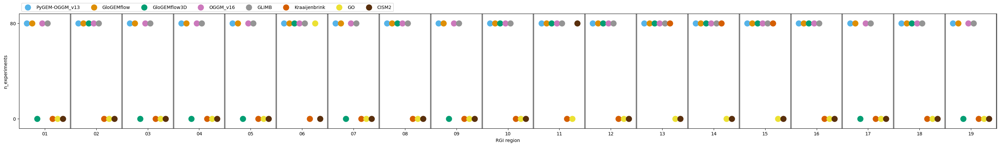

In [11]:
pd_regional_sum_initial_models = ds_reg_models.sel(simulation_year=0).to_dataframe()
pd_regional_sum_initial_models = pd_regional_sum_initial_models.reset_index()
#pd_reg_models = pd_reg_models.dropna()
pd_reg_models_count = pd_regional_sum_initial_models.groupby(['rgi_reg', 'model_author'])['volume_m3'].count().reset_index()
pd_reg_models_count = pd_reg_models_count.rename(columns={'volume_m3':'n_experiments'})
#pd_reg_models_count.loc[pd_reg_models_count.n_experiments == 80].groupby('rgi_reg').count()['model_author']
plt.figure(figsize=(30,4.5))
sns.pointplot( x='rgi_reg', y= 'n_experiments', hue='model_author',
             data=pd_reg_models_count,  #stacked=True,#ax=ax,
            hue_order=hue_order, #stacked =True,
            palette=pal_models, dodge=0.7, join = False,
             markers='o', scale=1.5)
ax = plt.gca()
h,l = ax.get_legend_handles_labels()
ax.legend(h, l, ncol=9, loc='lower left', bbox_to_anchor=(0,1))
for f in np.arange(0.5,19,1):
    ax.axvline(f, color= 'grey', ls='-', lw=3)
ax.set_yticks([0,80])
ax.set_ylim([-8,88])
plt.tight_layout()
ax.set_xlabel('RGI region')
plt.savefig(f'figures/0a_initial/0_glacierMIP3_n_experiments_w_oggm_{DATE}.png')

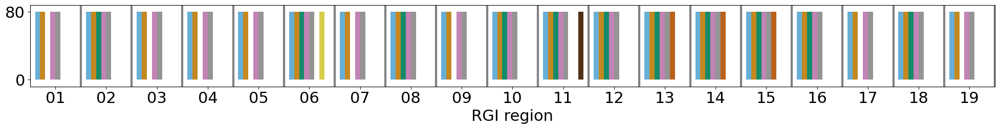

In [12]:
pd_regional_sum_initial_models = ds_reg_models.sel(simulation_year=0).to_dataframe()
pd_regional_sum_initial_models = pd_regional_sum_initial_models.reset_index()
#pd_reg_models = pd_reg_models.dropna()
pd_reg_models_count = pd_regional_sum_initial_models.groupby(['rgi_reg', 'model_author'])['volume_m3'].count().reset_index()
pd_reg_models_count = pd_reg_models_count.rename(columns={'volume_m3':'n_experiments'})
#pd_reg_models_count.loc[pd_reg_models_count.n_experiments == 80].groupby('rgi_reg').count()['model_author']
plt.figure(figsize=(20,3))
plt.rc('font', size=22)     

sns.barplot( x='rgi_reg', y= 'n_experiments', hue='model_author',
             data=pd_reg_models_count,  #stacked=True,#ax=ax,
            hue_order=hue_order,# stacked =True,
            palette=pal_models) #dodge=0.7, join = False,
             #markers='o', scale=1.5)
ax = plt.gca()
h,l = ax.get_legend_handles_labels()
leg = ax.legend(h, l, ncol=9, loc='lower left', bbox_to_anchor=(0,1))
leg.remove()
for f in np.arange(0.5,19,1):
    ax.axvline(f, color= 'grey', ls='-', lw=3)
plt.ylabel('')
ax.set_yticks([0,80])
ax.set_ylim([-8,88])
plt.tight_layout()
ax.set_xlabel('RGI region')
plt.savefig(f'figures/0a_initial/0_glacierMIP3_n_experiments_no_legend_{DATE}.png')

**create overview for presentation**

In [13]:
pd_regional_sum_initial_models = ds_reg_models.sel(simulation_year=0).to_dataframe()
pd_regional_sum_initial_models = pd_regional_sum_initial_models.reset_index()
#pd_reg_models = pd_reg_models.dropna()
pd_reg_models_count = pd_regional_sum_initial_models.groupby(['rgi_reg', 'model_author'])['volume_m3'].count().reset_index()
pd_reg_models_count = pd_reg_models_count.rename(columns={'volume_m3':'n_experiments'})
total_count= pd_reg_models_count.groupby('model_author').sum()

In [14]:
total_count= pd_reg_models_count.groupby('model_author').sum()

In [15]:
global_models = total_count.where(total_count== 1520).dropna().index.values
print(f'glacier models that are globally available for all experiments: n={len(global_models)}\n({global_models})')


glacier models that are globally available for all experiments: n=4
(['GLIMB' 'GloGEMflow' 'OGGM_v16' 'PyGEM-OGGM_v13'])


In [16]:
pd_reg_models_count.loc[pd_reg_models_count.model_author=='Kraaijenbrink']

,rgi_reg,model_author,n_experiments
5,01,Kraaijenbrink,0
13,02,Kraaijenbrink,0
21,03,Kraaijenbrink,0
29,04,Kraaijenbrink,0
37,05,Kraaijenbrink,0
45,06,Kraaijenbrink,0
53,07,Kraaijenbrink,0
61,08,Kraaijenbrink,0
69,09,Kraaijenbrink,0
77,10,Kraaijenbrink,0


In [17]:
one_region_models = total_count.where(total_count== 80).dropna().index.values
one_region_models

array(['CISM2', 'GO'], dtype=object)

In [18]:
total_count

,n_experiments
model_author,
CISM2,80
GLIMB,1520
GO,80
GloGEMflow,1520
GloGEMflow3D,880
Kraaijenbrink,240
OGGM_v16,1520
PyGEM-OGGM_v13,1520


#### Check: initial states

In [19]:
df_itmix.loc[rgidf_dict['12'].index.values]['vol_itmix_m3'].sum()

63079840497.255844

In [20]:
for rgi_reg in rgi_regs: #rgi_regs:
    pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.rgi_reg== rgi_reg].index,
                                  'rgi_area_m2'] = rgidf_dict[rgi_reg]['Area'].sum()*1e6
    pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.rgi_reg== rgi_reg].index,
                                  'itmix_vol_m3'] = df_itmix.loc[rgidf_dict[rgi_reg].index.values]['vol_itmix_m3'].sum()
pd_regional_sum_initial_models['perc_rgi_area'] = 100 * pd_regional_sum_initial_models['area_m2']/pd_regional_sum_initial_models['rgi_area_m2']
pd_regional_sum_initial_models['perc_itmix_vol'] = 100 * pd_regional_sum_initial_models['volume_m3']/pd_regional_sum_initial_models['itmix_vol_m3']

pd_regional_sum_initial_models = pd_regional_sum_initial_models.dropna()


np.testing.assert_allclose(pd_regional_sum_initial_models['perc_rgi_area'], 100)
np.testing.assert_allclose(pd_regional_sum_initial_models['perc_itmix_vol'], 100)


#pd_global_sum_initial_models = pd_regional_sum_initial_models.groupby(['period', 'gcm','ssp', 'model_author']).sum()#.reset_index()
#pd_global_sum_initial_models = pd_global_sum_initial_models.reset_index()

#pd_global_sum_initial_models['perc_rgi_area'] = 100 * pd_global_sum_initial_models['area_m2']/pd_global_sum_initial_models['rgi_area_m2']
#pd_global_sum_initial_models['perc_itmix_vol'] = 100 * pd_global_sum_initial_models['volume_m3']/pd_global_sum_initial_models['itmix_vol_m3']
#pd_global_sum_initial_models['model_author'] = model_author
#pd_global_sum_initial_models['rgi_reg'] = 'all'
#pd_regional_sum_initial_models = pd.concat([pd_global_sum_initial_models, pd_regional_sum_initial_models])

### just look at it before having done the scaling to 100% (kind of a sanity test, at least for those models that did not do an internal scaling already)

In [21]:
# without scaling
out_path = f'/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_{DATE}_models_all_rgi_regions_sum.nc'

ds_reg_models = xr.open_dataset(out_path)

pd_regional_sum_initial_models = ds_reg_models.sel(simulation_year=0).to_dataframe()
pd_regional_sum_initial_models = pd_regional_sum_initial_models.reset_index()
#pd_reg_models = pd_reg_models.dropna()
pd_reg_models_count = pd_regional_sum_initial_models.groupby(['rgi_reg', 'model_author'])['volume_m3'].count().reset_index()
pd_reg_models_count = pd_reg_models_count.rename(columns={'volume_m3':'n_experiments'})

for rgi_reg in rgi_regs: #rgi_regs:
    pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.rgi_reg== rgi_reg].index,
                                  'rgi_area_m2'] = rgidf_dict[rgi_reg]['Area'].sum()*1e6
    pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.rgi_reg== rgi_reg].index,
                                  'itmix_vol_m3'] = df_itmix.loc[rgidf_dict[rgi_reg].index.values]['vol_itmix_m3'].sum()
pd_regional_sum_initial_models['perc_rgi_area'] = 100 * pd_regional_sum_initial_models['area_m2']/pd_regional_sum_initial_models['rgi_area_m2']
pd_regional_sum_initial_models['perc_itmix_vol'] = 100 * pd_regional_sum_initial_models['volume_m3']/pd_regional_sum_initial_models['itmix_vol_m3']

pd_regional_sum_initial_models = pd_regional_sum_initial_models.dropna()

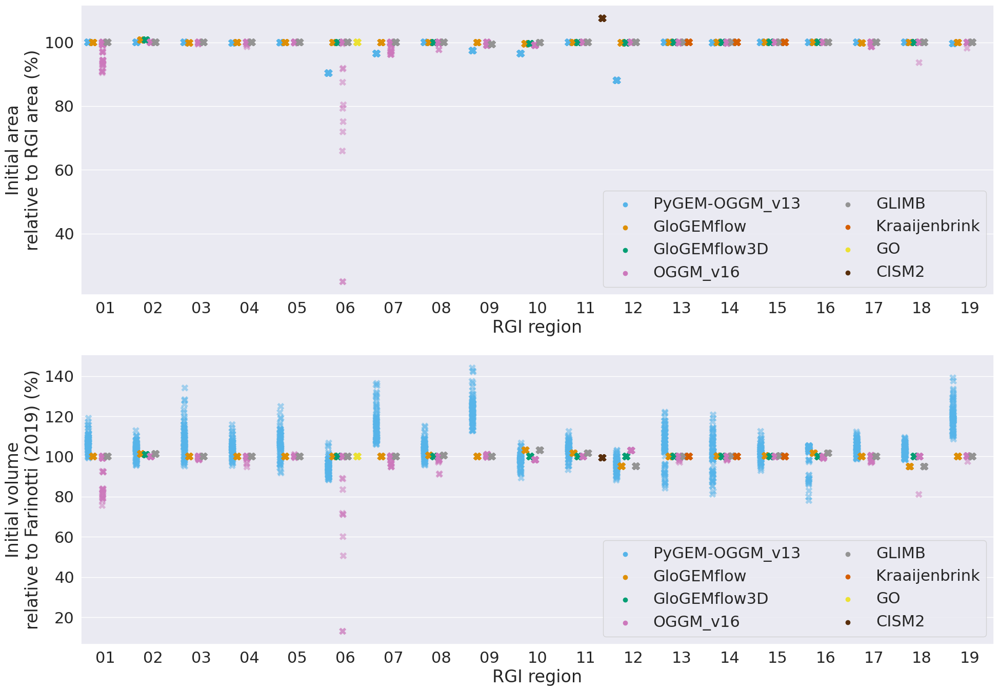

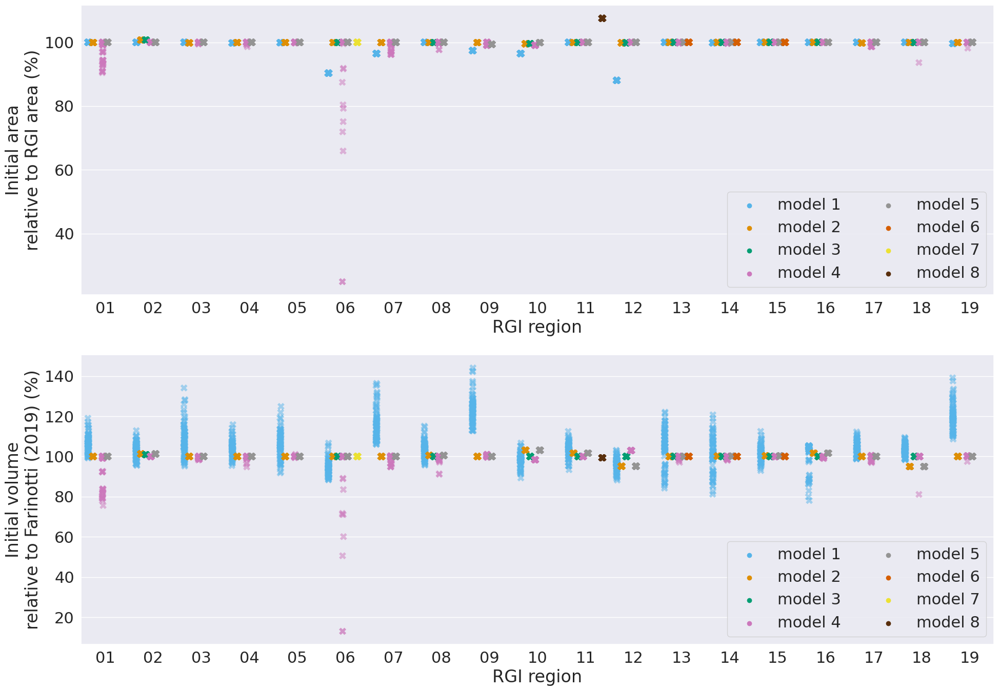

In [22]:
from matplotlib.lines import Line2D

sns.set(font_scale=2)
#ssp_cols = sns.color_palette(['silver', 'deepskyblue', 'orange', 'red'])
for anonym in ['', '_anonym']:
    fig, axs = plt.subplots(2,1, figsize=(20,14))
    #plt.suptitle(')

    sns.stripplot(data=pd_regional_sum_initial_models, #.loc['hist' in pd_regional_sum_initial_models.period_ssp],
                                hue_order=hue_order,
                  palette = pal_models,
                #col_wrap=1,
                #col_order=col_order,
                #aspect=2,
                  order = rgi_regs,
                x='rgi_reg', y='perc_rgi_area',
                ax = axs[0],
                dodge=True,
                  alpha = 0.5,
                hue='model_author', #palette=ssp_cols,
                #kind='strip',
                #whis = [5,95], #hue_order = ['2040', '2100'],
                        linewidth=0.5,
                size=10,
                  marker='X',
                edgecolor='None',
                # = False,
                #col='ssp',
                #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                        #capprops={'color':'grey', 'alpha':0.7},
                        #whiskerprops={'color':'grey', 'alpha':0.7}
               )

    #axs[0].set_ylim([70,130])
    handles, labels = axs[0].get_legend_handles_labels()
    if anonym:
        axs[0].legend(handles, hue_order_anonymous, ncol=2)
    else:
        axs[0].legend(ncol=2)

    axs[0].set_ylabel('Initial area\nrelative to RGI area (%)')
    axs[0].set_xlabel('RGI region')

    sns.stripplot(data=pd_regional_sum_initial_models, #.loc[pd_regional_sum_initial_models.ssp == 'hist'],
                                hue_order=hue_order,
                  palette = pal_models,
                #col_wrap=1,
                #col_order=col_order,
                #aspect=2,
                  order = rgi_regs,
                x='rgi_reg', y='perc_itmix_vol',
                ax = axs[1],
                dodge=True,
                hue='model_author', #palette=ssp_cols,
                #kind='strip',
                #whis = [5,95], #hue_order = ['2040', '2100'],
                        linewidth=0.5,
                size=10,
                  marker='X',
                  alpha = 0.5,
                edgecolor='None',
                # = False,
                #col='ssp',
                #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                        #capprops={'color':'grey', 'alpha':0.7},
                        #whiskerprops={'color':'grey', 'alpha':0.7}
               )  
    handles, labels = axs[1].get_legend_handles_labels()

    if anonym:
        axs[1].legend(handles, hue_order_anonymous, ncol=2)
    else:
        axs[1].legend(ncol=2)
    axs[1].set_ylabel('Initial volume\nrelative to Farinotti (2019) (%)')
    axs[1].set_xlabel('RGI region')
    plt.tight_layout()
    plt.savefig(f'figures/0a_initial/0_glacierMIP3_initial_state_before_scaling_{DATE}{anonym}.png')

- In RGI region 06, OGGM has many missing glaciers and the relative glacier area and volume even after filling is way too small. Do we have to do sth. there or is the simple scaling just ok as we do not focus on Iceland? 

In [70]:



np.testing.assert_allclose(pd_regional_sum_initial_models['perc_itmix_vol'], 100, rtol = 0.5)
np.testing.assert_allclose(pd_regional_sum_initial_models['perc_rgi_area'], 100, rtol =0.2)



AssertionError: 
Not equal to tolerance rtol=0.5, atol=0

Mismatched elements: 2 / 9868 (0.0203%)
Max absolute difference: 87.0197732
Max relative difference: 0.87019773
 x: array([ 99.097363,  99.097363,  99.097363, ..., 100.008313, 100.008313,
       100.008313])
 y: array(100)

In [71]:
np.testing.assert_allclose(pd_regional_sum_initial_models['perc_itmix_vol'], 100, rtol = 0.5)


AssertionError: 
Not equal to tolerance rtol=0.5, atol=0

Mismatched elements: 2 / 9868 (0.0203%)
Max absolute difference: 87.0197732
Max relative difference: 0.87019773
 x: array([ 99.097363,  99.097363,  99.097363, ..., 100.008313, 100.008313,
       100.008313])
 y: array(100)

In [72]:
# problem !!!-> SOLVED
pd_regional_sum_initial_models[pd_regional_sum_initial_models['perc_rgi_area']>105]

,model_author,gcm,rgi_reg,period_scenario,simulation_year,volume_m3,area_m2,rgi_area_m2,itmix_vol_m3,perc_rgi_area,perc_itmix_vol
160,CISM2,gfdl-esm4,11,1851-1870_hist,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363
161,CISM2,gfdl-esm4,11,1901-1920_hist,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363
162,CISM2,gfdl-esm4,11,1951-1970_hist,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363
163,CISM2,gfdl-esm4,11,1995-2014_hist,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363
164,CISM2,gfdl-esm4,11,2021-2040_ssp126,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363
...,...,...,...,...,...,...,...,...,...,...,...
1387,CISM2,ukesm1-0-ll,11,2061-2080_ssp370,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363
1388,CISM2,ukesm1-0-ll,11,2061-2080_ssp585,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363
1389,CISM2,ukesm1-0-ll,11,2081-2100_ssp126,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363
1390,CISM2,ukesm1-0-ll,11,2081-2100_ssp370,0,1.267696e+11,2.234811e+09,2.092146e+09,1.279243e+11,106.819068,99.097363


In [73]:
# new problem OGGM
pd_regional_sum_initial_models[pd_regional_sum_initial_models['perc_rgi_area']<80]


,model_author,gcm,rgi_reg,period_scenario,simulation_year,volume_m3,area_m2,rgi_area_m2,itmix_vol_m3,perc_rgi_area,perc_itmix_vol
11024,OGGM_v16,ipsl-cm6a-lr,06,1851-1870_hist,0,4.892992e+11,2.752906e+09,1.105970e+10,3.769574e+12,24.891325,12.980227
11025,OGGM_v16,ipsl-cm6a-lr,06,1901-1920_hist,0,4.896252e+11,2.752219e+09,1.105970e+10,3.769574e+12,24.885118,12.988874
11026,OGGM_v16,ipsl-cm6a-lr,06,1951-1970_hist,0,2.682566e+12,8.767944e+09,1.105970e+10,3.769574e+12,79.278312,71.163653
11329,OGGM_v16,mpi-esm1-2-hr,06,1901-1920_hist,0,2.679223e+12,8.307097e+09,1.105970e+10,3.769574e+12,75.111413,71.074951
11632,OGGM_v16,mri-esm2-0,06,1851-1870_hist,0,1.906269e+12,7.288657e+09,1.105970e+10,3.769574e+12,65.902846,50.569895
11937,OGGM_v16,ukesm1-0-ll,06,1901-1920_hist,0,2.265462e+12,7.953233e+09,1.105970e+10,3.769574e+12,71.911830,60.098638


In [74]:
pd_regional_sum_initial_models[pd_regional_sum_initial_models['perc_itmix_vol']<65]

,model_author,gcm,rgi_reg,period_scenario,simulation_year,volume_m3,area_m2,rgi_area_m2,itmix_vol_m3,perc_rgi_area,perc_itmix_vol
11024,OGGM_v16,ipsl-cm6a-lr,06,1851-1870_hist,0,4.892992e+11,2.752906e+09,1.105970e+10,3.769574e+12,24.891325,12.980227
11025,OGGM_v16,ipsl-cm6a-lr,06,1901-1920_hist,0,4.896252e+11,2.752219e+09,1.105970e+10,3.769574e+12,24.885118,12.988874
11632,OGGM_v16,mri-esm2-0,06,1851-1870_hist,0,1.906269e+12,7.288657e+09,1.105970e+10,3.769574e+12,65.902846,50.569895
11937,OGGM_v16,ukesm1-0-ll,06,1901-1920_hist,0,2.265462e+12,7.953233e+09,1.105970e+10,3.769574e+12,71.911830,60.098638
12272,OGGM-VAS,gfdl-esm4,08,1851-1870_hist,0,1.815727e+11,2.939810e+09,2.949103e+09,2.985090e+11,99.684886,60.826529
...,...,...,...,...,...,...,...,...,...,...,...
13499,OGGM-VAS,ukesm1-0-ll,08,2061-2080_ssp370,0,1.815727e+11,2.939810e+09,2.949103e+09,2.985090e+11,99.684886,60.826529
13500,OGGM-VAS,ukesm1-0-ll,08,2061-2080_ssp585,0,1.815727e+11,2.939810e+09,2.949103e+09,2.985090e+11,99.684886,60.826529
13501,OGGM-VAS,ukesm1-0-ll,08,2081-2100_ssp126,0,1.815727e+11,2.939810e+09,2.949103e+09,2.985090e+11,99.684886,60.826529
13502,OGGM-VAS,ukesm1-0-ll,08,2081-2100_ssp370,0,1.815727e+11,2.939810e+09,2.949103e+09,2.985090e+11,99.684886,60.826529


In [23]:
pd_regional_sum_initial_models.perc_rgi_area

0         99.999999
1         99.999999
2         99.999999
3         99.999999
4         99.999999
            ...    
12027    100.000002
12028    100.000002
12029    100.000002
12030    100.000002
12031    100.000002
Name: perc_rgi_area, Length: 7360, dtype: float64

## OLD

In [ ]:
from matplotlib.lines import Line2D

sns.set(font_scale=1.5)
#ssp_cols = sns.color_palette(['silver', 'deepskyblue', 'orange', 'red'])

fig, axs = plt.subplots(2,1, figsize=(26,24))
#plt.suptitle(')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.period_ssp == 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_rgi_area',
            ax = axs[0],
            dodge=True,
              alpha = 0.5,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=10,
              marker='X',
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
axs[0].get_legend().remove() #loc='lower right', title='historical')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.period_ssp != 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_rgi_area',
            ax = axs[0],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=8,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
#axa
#axs[0].get_legend(loc='lower right', title='historical')
handles, labels = axs[0].get_legend_handles_labels()
axs[0].get_legend().remove()
leg1 = axs[0].legend(handles[7:], labels[7:], title='model_author')

handlis = [Line2D([0], [0], color='black', marker='X', markersize=10, alpha =0.5, lw=0),
            Line2D([0], [0], color='black', marker='o', markersize=8, alpha =1, lw=0)]
axs[0].legend(handlis,
          ['historical', 'future'], loc='lower right', title='experiments (4 time\nperiods aggregated):')
axs[0].add_artist(leg1)

axs[0].axhline(100, color='grey')
axs[0].set_ylabel('relative area at simulation year 0 compared to RGI (%)')
#axs[0].text(15, 47, '90%-range indicated')
for f in np.arange(0.5,19,1):
    axs[0].axvline(f, color= 'grey', ls='-', lw=3)

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp == 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_itmix_vol',
            ax = axs[1],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=10,
              marker='X',
              alpha = 0.5,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )    
axs[1].get_legend().remove() #loc='lower right', title='historical')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp != 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_itmix_vol',
            ax = axs[1],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=8,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
handles, labels = axs[1].get_legend_handles_labels()
axs[1].get_legend().remove()
leg1 = axs[1].legend(handles[7:], labels[7:], title='model_author')

handlis = [Line2D([0], [0], color='black', marker='X', markersize=10, alpha =0.5, lw=0),
            Line2D([0], [0], color='black', marker='o', markersize=8, alpha =1, lw=0)]
axs[1].legend(handlis,
          ['historical', 'future'], loc='lower right', title='experiments (4 time\nperiods aggregated):')
axs[1].add_artist(leg1)

axs[1].axhline(100, color='grey')
axs[1].set_ylabel('relative volume at simulation year 0 compared to Farinotti (%)')
#axs[0].text(15, 47, '90%-range indicated')
for f in np.arange(0.5,19,1):
    axs[1].axvline(f, color= 'grey', ls='-', lw=3)

plt.tight_layout()
#plt.savefig('/home/users/lschuster/www_lschuster/glacierMIP3_analysis/glacierMIP3_regional_initial_state_model_comparison_woggm_new_PyGEM.png')

In [32]:
# dummy dataset ... w. 5001 entries
ds_nan_5001 = xr.open_dataset(get_path(rgi_reg='01'))
ds_nan_5001.volume_m3.data[...] = np.NaN
ds_nan_5001.area_m2.data[...] = np.NaN

# dummy dataset ... w. 2001 entries
ds_nan_2001 = xr.open_dataset(get_path(rgi_reg='02')) 
ds_nan_2001.volume_m3.data[...] = np.NaN
ds_nan_2001.area_m2.data[...] = np.NaN

# these regions should run until 5000 years:
rgi_regs_5000 = ['01', '03', '04', '05', '06','07', '09', '17','19']

model_authors = ['Huss','Rounce','Compagno','Kraaijenbrink','GLIMB']

### regional (uncorrected, except for Rounce)
missing_exp = []
run = False #True
if run:
    ds_m = []
    for model_author in model_authors:
        _ds_reg = []
        for rgi_reg in rgi_regs: #'01'
            # want to have the right simulation year length
            _l_period = []
            for y0_time in y0_times[:4]:
                period = f'{y0_time}-{y0_time+19}'
                _l_scenario = []
                for scenario in scenarios[:1]:
                    _l_gcm = []
                    for gcm in gcms:
                        path = get_path(rgi_reg=rgi_reg, model_author=model_author, period=period, gcm=gcm, ssp=scenario)
                        try:
                            if model_author == 'Compagno' or model_author == 'Huss':
                                _ds = xr.open_dataset(path)
                                # wrong netcdf shape and simulation year 1 year too short ...
                                if len(_ds.volume_m3.squeeze()) == 5000:
                                    ds = ds_nan_5001.copy(deep=True)
                                elif len(_ds.volume_m3.squeeze()) == 2000:
                                    ds = ds_nan_2001.copy(deep=True)
                                if model_author == 'Huss':
                                    ds.volume_m3.data[:-1] = _ds.volume_m3.squeeze() 
                                else:
                                    ds.volume_m3.data[:-1] = _ds.volume_m3.squeeze()*1e9 # is in km3 instead of m3
                                ds.area_m2.data[:-1] = _ds.area_m2.squeeze()
                                ds.volume_m3[-1] = ds.volume_m3[-2].values
                                ds.area_m2[-1] = ds.area_m2[-2].values
                                ds.attrs.update(_ds.attrs)
                            else:
                                ds = xr.open_dataset(path)
                        except:
                            if rgi_reg in rgi_regs_5000:
                                ds = ds_nan_5001.copy(deep=True)
                            else:
                                ds = ds_nan_2001.copy(deep=True)
                            missing_exp.append(path)

                                
                        ds = ds.expand_dims({'gcm':[gcm], 'ssp':[scenario], 'period':[period], 'rgi_reg':[rgi_reg]})
                        _l_gcm.append(ds)
                    _l_scenario.append(xr.concat(_l_gcm, dim='gcm'))

                _l_period.append(xr.concat(_l_scenario, dim='ssp'))
            ds_past = xr.concat(_l_period, dim='period')

            _l_period = []
            for y0_time in y0_times[4:]:
                period = f'{y0_time}-{y0_time+19}'
                _l_scenario = []
                for scenario in scenarios[1:]:
                    _l_gcm = []
                    for gcm in gcms:
                        path = get_path(rgi_reg=rgi_reg, model_author=model_author, period=period, gcm=gcm, ssp=scenario)
                        try:
                            if model_author == 'Compagno' or model_author == 'Huss':
                                _ds = xr.open_dataset(path)
                                # wrong netcdf shape and simulation year 1 year too short ...
                                if len(_ds.volume_m3.squeeze()) == 5000:
                                    ds = ds_nan_5001.copy(deep=True)
                                elif len(_ds.volume_m3.squeeze()) == 2000:
                                    ds = ds_nan_2001.copy(deep=True)
                                if model_author == 'Huss':
                                    ds.volume_m3.data[:-1] = _ds.volume_m3.squeeze() 
                                else:
                                    ds.volume_m3.data[:-1] = _ds.volume_m3.squeeze()*1e9 # is in km3 instead of m3
                                ds.area_m2.data[:-1] = _ds.area_m2.squeeze()
                                ds.volume_m3[-1] = ds.volume_m3[-2].values
                                ds.area_m2[-1] = ds.area_m2[-2].values
                                ds.attrs.update(_ds.attrs)
                            else:
                                ds = xr.open_dataset(path)
                        except:
                            if rgi_reg in rgi_regs_5000:
                                ds = ds_nan_5001.copy(deep=True)
                            else:
                                ds = ds_nan_2001.copy(deep=True)
                            missing_exp.append(path)
                        ds = ds.expand_dims({'gcm':[gcm], 'ssp':[scenario], 'period':[period], 'rgi_reg':[rgi_reg]})
                        _l_gcm.append(ds)
                    _l_scenario.append(xr.concat(_l_gcm, dim='gcm'))
                _l_period.append(xr.concat(_l_scenario, dim='ssp'))
            ds_future = xr.concat(_l_period, dim='period')
            _ds_reg_single = xr.concat([ds_past, ds_future], dim = 'ssp')
            _ds_reg_single
            _ds_reg.append(_ds_reg_single)

        ds = xr.concat(_ds_reg, dim='rgi_reg')

        # expand the rgi regions that only run until 5000 by using the last simulated year
        for rgi_reg_id,rgi_reg in enumerate(rgi_regs): #'01'
            if np.all(np.isnan(ds.sel(rgi_reg =rgi_reg).volume_m3.values)) and np.all(np.isnan(ds.sel(rgi_reg =rgi_reg).area_m2.values)):
                # ok we do not have any regional data for that region and model_author, just keep the values np.NaN...
                pass
            elif rgi_reg in rgi_regs_5000:
                # check that not all are nan-values!
                assert not np.all(np.isnan(ds.sel(rgi_reg =rgi_reg).sel(simulation_year=slice(2001,5001)).volume_m3.values))
            else:    
                try:
                    # check that it is really always np.NaN values after simulation year 2000 for that region
                    assert np.all(np.isnan(ds.sel(rgi_reg =rgi_reg).sel(simulation_year=slice(2001,5001)).volume_m3.values))
                    assert np.all(np.isnan(ds.sel(rgi_reg =rgi_reg).sel(simulation_year=slice(2001,5001)).area_m2.values))

                    # fill them up with the last simulation year values 
                    for y in np.arange(2001,5001):
                        ds['volume_m3'].data[..., rgi_reg_id, y] = ds.sel(rgi_reg =rgi_reg).sel(simulation_year=2000).volume_m3.values
                        ds['area_m2'].data[..., rgi_reg_id, y] = ds.sel(rgi_reg =rgi_reg).sel(simulation_year=2000).area_m2.values
                except:
                    # ok some models did run over all regions for 5000 years
                    print('runs for 5000 years: ' , model_author, rgi_reg)
                    pass

        ds = ds.expand_dims({'model_author':[model_author]})
        #if 'model_author' == 'Compagno':
        #    ds['volume_m3']=ds['volume_m3']*1e9 # is in km3 instead of m3
        ds_m.append(ds)
    
    ds_reg_models = xr.concat(ds_m, dim='model_author', combine_attrs='drop')
    out_path = '/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_5models_all_rgi_regions_sum_no_run_away.nc'
    
    ### also open Dave's raw data
    # daves old data 
    #ds_rounce_unfilled = xr.open_dataset('/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_Rounce_all_rgi_regions_sum.nc')
    #ds_rounce_unfilled.coords['model_author'].data[...] = 'Rounce_unfilled'
    #ds_reg_models = xr.concat([ds_rounce_unfilled, ds_reg_models], dim='model_author')
    
    #ds_reg_models.to_netcdf(out_path)
    # This is the same for all files
    encoding = {
        'simulation_year': {"dtype": "int16"},
        'volume_m3': {"dtype": "float32"},
        'area_m2': {"dtype": "float32"},
    }
    ds_reg_models.to_netcdf(out_path, encoding = encoding)
else:
    out_path = '/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_5models_all_rgi_regions_sum_no_run_away.nc'

    ds_reg_models = xr.open_dataset(out_path)
    out_path_oggm = '/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_oggm_models_all_rgi_regions_sum.nc'
    ds_reg_models_oggm_versions = xr.open_dataset(out_path_oggm)
    ds_reg_models = xr.concat([ds_reg_models, ds_reg_models_oggm_versions], dim='model_author')
# actually Fabi said I should rather have such a coordinate ... at some point I should change that ...
#ds_reg_models.coords['ssp_period'] = ds_reg_models.period +'_' + ds_reg_models.ssp

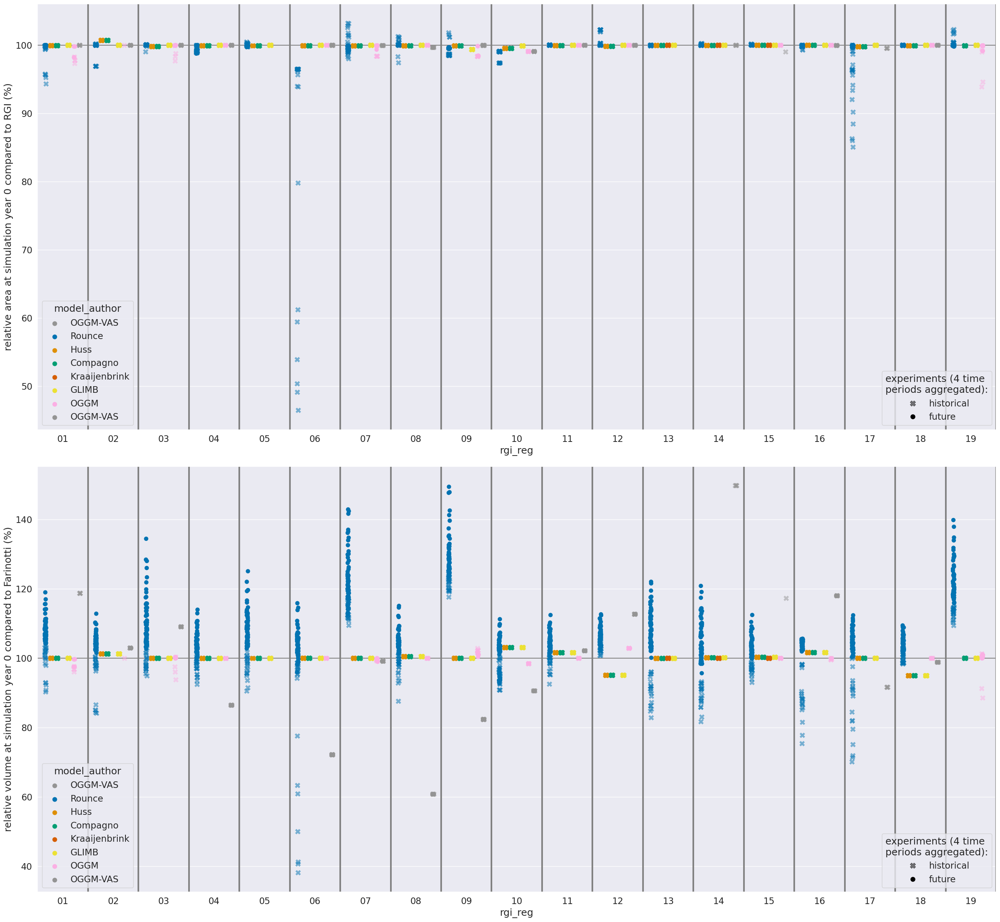

In [14]:
from matplotlib.lines import Line2D

sns.set(font_scale=1.5)
#ssp_cols = sns.color_palette(['silver', 'deepskyblue', 'orange', 'red'])

fig, axs = plt.subplots(2,1, figsize=(26,24))
#plt.suptitle(')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp == 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_rgi_area',
            ax = axs[0],
            dodge=True,
              alpha = 0.5,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=10,
              marker='X',
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
axs[0].get_legend().remove() #loc='lower right', title='historical')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp != 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_rgi_area',
            ax = axs[0],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=8,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
#axa
#axs[0].get_legend(loc='lower right', title='historical')
handles, labels = axs[0].get_legend_handles_labels()
axs[0].get_legend().remove()
leg1 = axs[0].legend(handles[6:], labels[6:], title='model_author')

handlis = [Line2D([0], [0], color='black', marker='X', markersize=10, alpha =0.5, lw=0),
            Line2D([0], [0], color='black', marker='o', markersize=8, alpha =1, lw=0)]
axs[0].legend(handlis,
          ['historical', 'future'], loc='lower right', title='experiments (4 time\nperiods aggregated):')
axs[0].add_artist(leg1)

axs[0].axhline(100, color='grey')
axs[0].set_ylabel('relative area at simulation year 0 compared to RGI (%)')
#axs[0].text(15, 47, '90%-range indicated')
for f in np.arange(0.5,19,1):
    axs[0].axvline(f, color= 'grey', ls='-', lw=3)

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp == 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_itmix_vol',
            ax = axs[1],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=10,
              marker='X',
              alpha = 0.5,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )    
axs[1].get_legend().remove() #loc='lower right', title='historical')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp != 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_itmix_vol',
            ax = axs[1],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=8,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
handles, labels = axs[1].get_legend_handles_labels()
axs[1].get_legend().remove()
leg1 = axs[1].legend(handles[6:], labels[6:], title='model_author')

handlis = [Line2D([0], [0], color='black', marker='X', markersize=10, alpha =0.5, lw=0),
            Line2D([0], [0], color='black', marker='o', markersize=8, alpha =1, lw=0)]
axs[1].legend(handlis,
          ['historical', 'future'], loc='lower right', title='experiments (4 time\nperiods aggregated):')
axs[1].add_artist(leg1)

axs[1].axhline(100, color='grey')
axs[1].set_ylabel('relative volume at simulation year 0 compared to Farinotti (%)')
#axs[0].text(15, 47, '90%-range indicated')
for f in np.arange(0.5,19,1):
    axs[1].axvline(f, color= 'grey', ls='-', lw=3)

plt.tight_layout()
plt.savefig('/home/users/lschuster/www_lschuster/glacierMIP3_analysis/glacierMIP3_regional_initial_state_model_comparison_woggm.png')

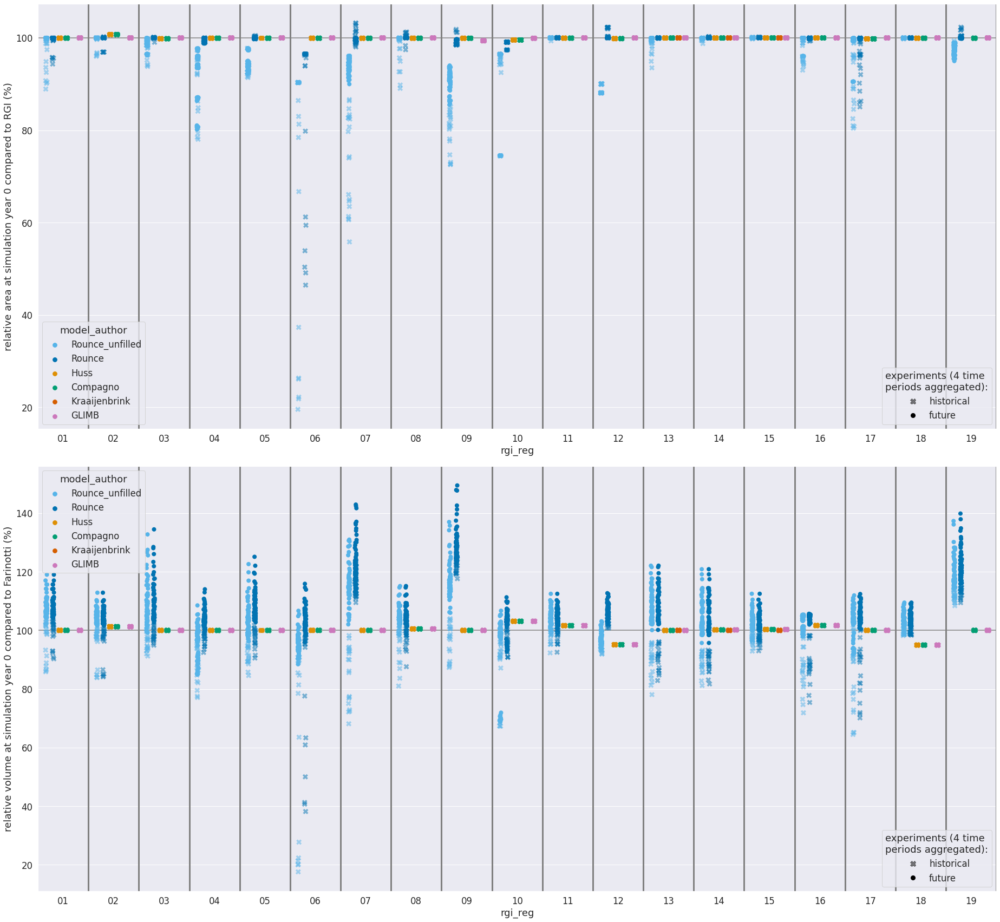

In [10]:
from matplotlib.lines import Line2D

sns.set(font_scale=1.5)
#ssp_cols = sns.color_palette(['silver', 'deepskyblue', 'orange', 'red'])

fig, axs = plt.subplots(2,1, figsize=(26,24))
#plt.suptitle(')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp == 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_rgi_area',
            ax = axs[0],
            dodge=True,
              alpha = 0.5,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=10,
              marker='X',
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
axs[0].get_legend().remove() #loc='lower right', title='historical')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp != 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_rgi_area',
            ax = axs[0],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=8,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
#axa
#axs[0].get_legend(loc='lower right', title='historical')
handles, labels = axs[0].get_legend_handles_labels()
axs[0].get_legend().remove()
leg1 = axs[0].legend(handles[6:], labels[6:], title='model_author')

handlis = [Line2D([0], [0], color='black', marker='X', markersize=10, alpha =0.5, lw=0),
            Line2D([0], [0], color='black', marker='o', markersize=8, alpha =1, lw=0)]
axs[0].legend(handlis,
          ['historical', 'future'], loc='lower right', title='experiments (4 time\nperiods aggregated):')
axs[0].add_artist(leg1)

axs[0].axhline(100, color='grey')
axs[0].set_ylabel('relative area at simulation year 0 compared to RGI (%)')
#axs[0].text(15, 47, '90%-range indicated')
for f in np.arange(0.5,19,1):
    axs[0].axvline(f, color= 'grey', ls='-', lw=3)

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp == 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_itmix_vol',
            ax = axs[1],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=10,
              marker='X',
              alpha = 0.5,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )    
axs[1].get_legend().remove() #loc='lower right', title='historical')

sns.stripplot(data=pd_regional_sum_initial_models.loc[pd_regional_sum_initial_models.ssp != 'hist'],
                            hue_order=hue_order,
              palette = pal_models,
            #col_wrap=1,
            #col_order=col_order,
            #aspect=2,
              order = rgi_regs,
            x='rgi_reg', y='perc_itmix_vol',
            ax = axs[1],
            dodge=True,
            hue='model_author', #palette=ssp_cols,
            #kind='strip',
            #whis = [5,95], #hue_order = ['2040', '2100'],
                    linewidth=0.5,
            size=8,
            edgecolor='None',
            # = False,
            #col='ssp',
            #saturation=0.7,# aspect=1.6, #order = ['var_an_cycle'],
                    #capprops={'color':'grey', 'alpha':0.7},
                    #whiskerprops={'color':'grey', 'alpha':0.7}
           )
handles, labels = axs[1].get_legend_handles_labels()
axs[1].get_legend().remove()
leg1 = axs[1].legend(handles[6:], labels[6:], title='model_author')

handlis = [Line2D([0], [0], color='black', marker='X', markersize=10, alpha =0.5, lw=0),
            Line2D([0], [0], color='black', marker='o', markersize=8, alpha =1, lw=0)]
axs[1].legend(handlis,
          ['historical', 'future'], loc='lower right', title='experiments (4 time\nperiods aggregated):')
axs[1].add_artist(leg1)

axs[1].axhline(100, color='grey')
axs[1].set_ylabel('relative volume at simulation year 0 compared to Farinotti (%)')
#axs[0].text(15, 47, '90%-range indicated')
for f in np.arange(0.5,19,1):
    axs[1].axvline(f, color= 'grey', ls='-', lw=3)

plt.tight_layout()
plt.savefig('/home/users/lschuster/www_lschuster/glacierMIP3_analysis/glacierMIP3_regional_initial_state_model_comparison.png')

In [ ]:
run = False
# rename the data ... ok I do that later ...
if run:
    for rgi_reg in arange(1,20,1):
        if rgi_reg < 10:
            rgi_reg = '0'+str(rgi_reg)
        else:
            rgi_reg = str(rgi_reg)

        for tip in ['regional']:
            path = f'/home/www/lschuster/glacierMIP3_analysis/{model_author}/' #{tip}/{rgi_reg}/'
            # get all files with wrong name 
            if tip == 'regional':
                files = glob.glob(f'{path}{model_author}_rgi{rgi_reg}_sum_ssp*_'+'psl_cm6a-lr')
            elif tip == 'per_glacier':
                files = glob.glob(f'{path}{model_author}_rgi{rgi_reg}_glaciers_ssp*')
            # first part of the filename where the end is the part that we want to remove (i.e.  _ssp126, _ssp370, or _ssp585)
            # Dave put _ssp126 /_ssp585 ... once too often into the file , we only want to have it at the end of the file!!!
            if tip == 'regional':
                false_path_first = f'{path}{model_author}_rgi{rgi_reg}_sum_ssp126'   # _ssp126, _ssp370, or _ssp585 always have the same amount of "letter" that have to be removed ...
            elif tip == 'per_glacier':
                false_path_first = f'{path}{model_author}_rgi{rgi_reg}_glaciers_ssp126' 
            # amount of letters that correspond to the first part of the filename path that is replaced by a new filename path
            len_p_first =len(false_path_first)
            # remove the wrong letters
            correct_path_first = false_path_first[:-len('_ssp126')] 
            for f in files:
                correct_filename = correct_path_first + f[len_p_first:]
                #print(f, correct_filename)
                os.rename(f, correct_filename)

#### harry's plots


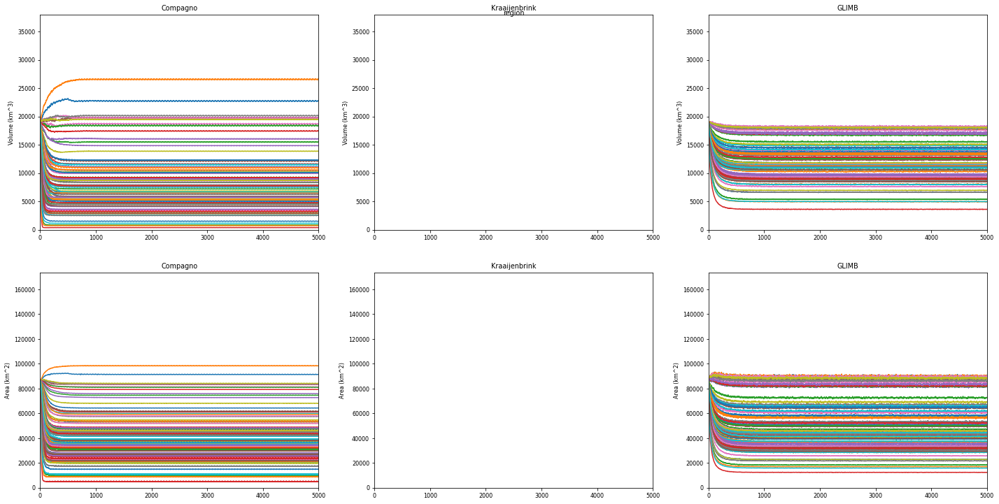

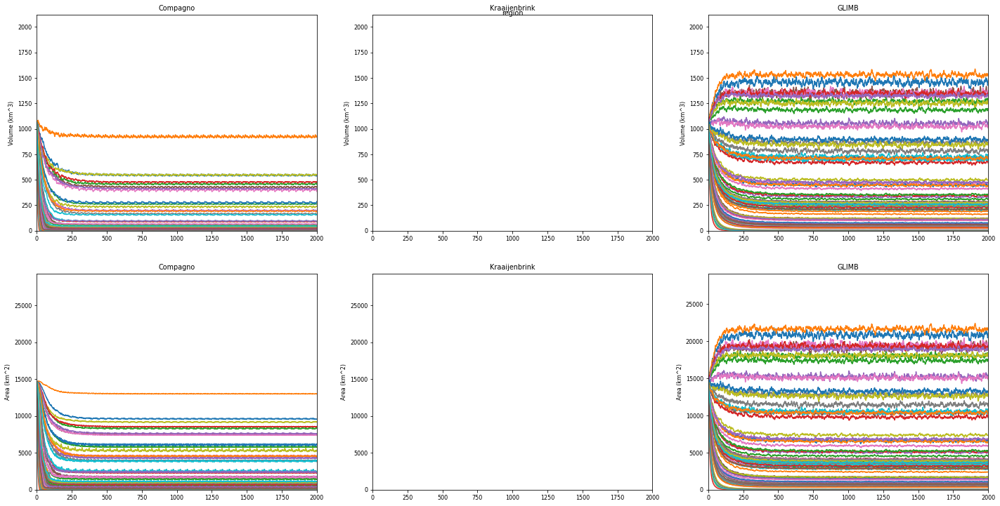

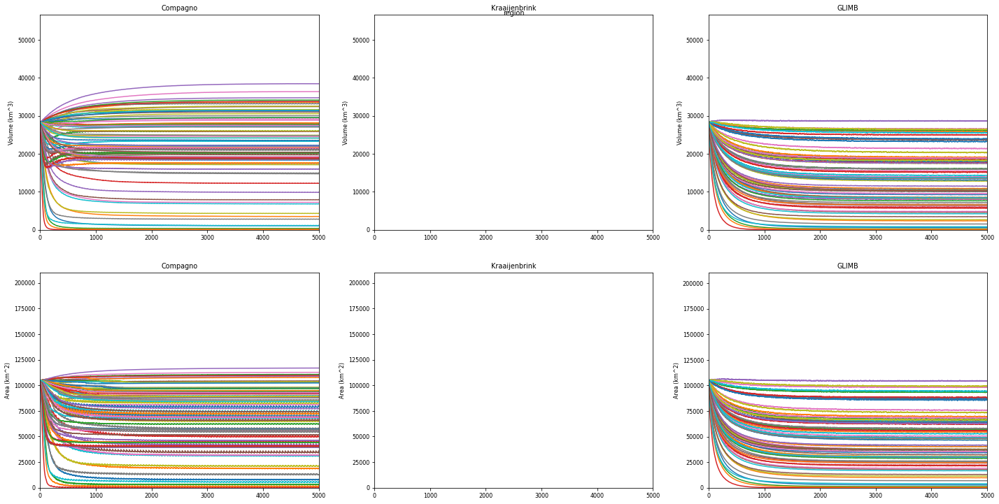

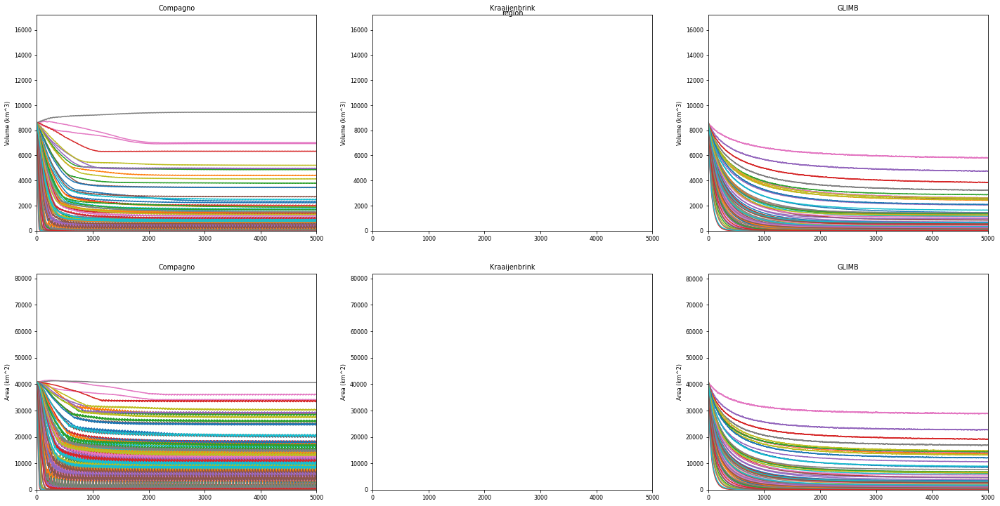

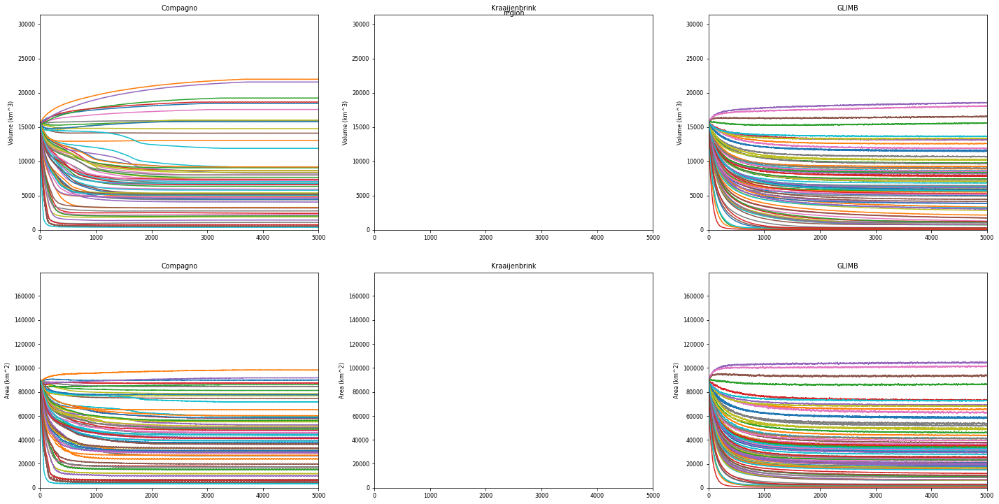

...

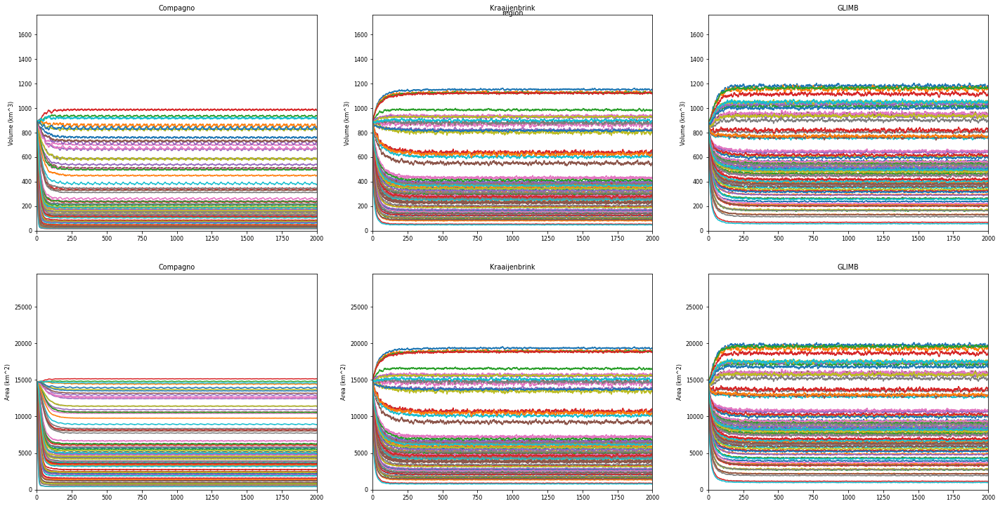

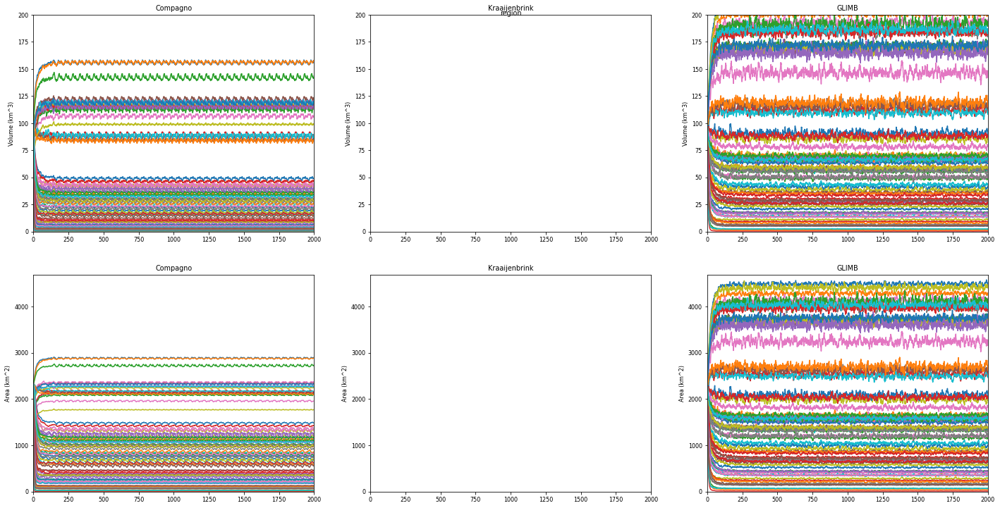

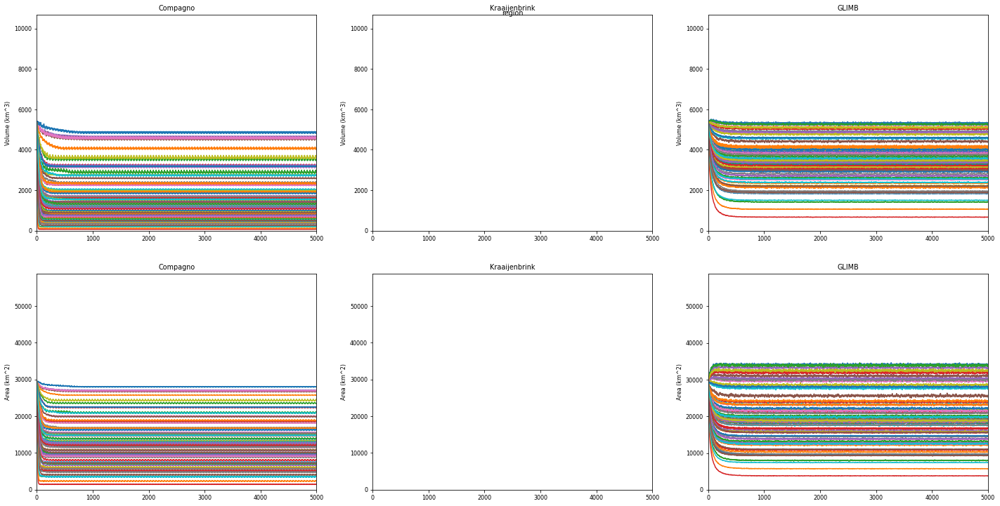

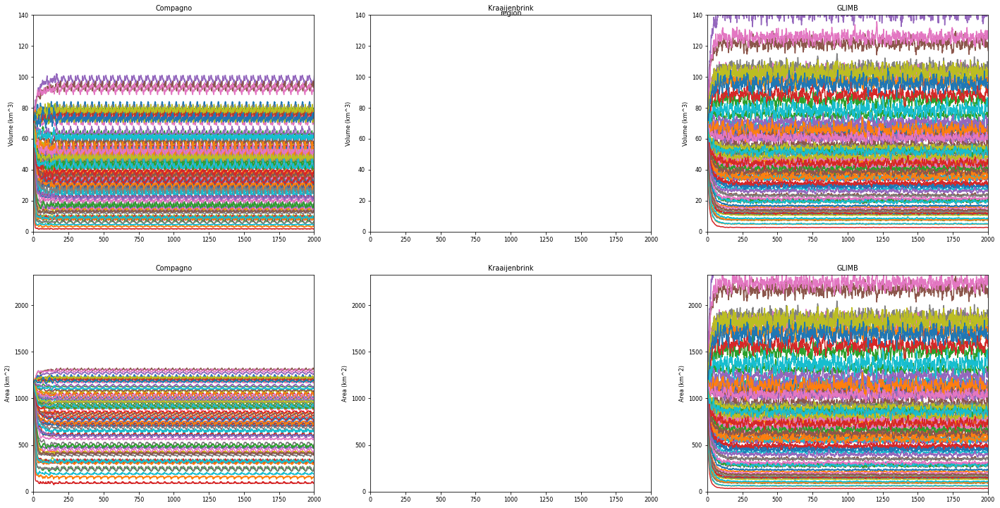

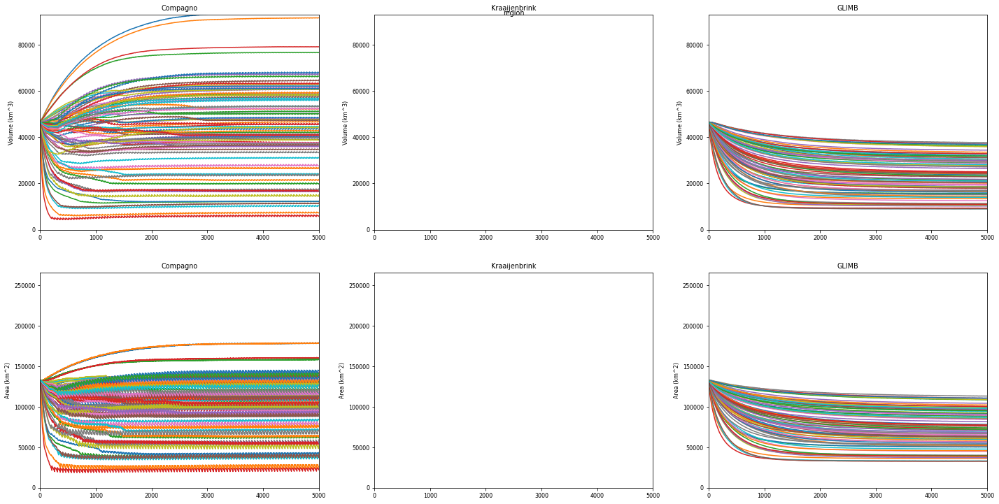

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import pathlib

regions= np.arange(19)+1
mb_forcing_ids = np.arange(80)+1
participants=['Compagno','Kraaijenbrink','GLIMB']  ##'Huss',

data_excel=pd.read_excel("GMIP3-chains.xlsx", header=None)
plt.close('all')

# Length NetCDF files according to GlacierMIP3 GitHub page
netcdf_length=np.zeros((20,1))
netcdf_length[1]=5000
netcdf_length[2]=2000
netcdf_length[3]=5000
netcdf_length[4]=5000
netcdf_length[5]=5000
netcdf_length[6]=5000
netcdf_length[7]=5000
netcdf_length[8]=2000
netcdf_length[9]=5000
netcdf_length[10]=2000
netcdf_length[11]=2000
netcdf_length[12]=2000
netcdf_length[13]=2000
netcdf_length[14]=2000
netcdf_length[15]=2000
netcdf_length[16]=2000
netcdf_length[17]=5000
netcdf_length[18]=2000
netcdf_length[19]=5000

for dummy,region in enumerate(regions): # For every region --> make plot
    plt.figure(region,figsize=(20,10))
    plt.rcParams.update({'font.size': 8})
    plt.subplots_adjust(left=.03, bottom=.03, right=.97, top=.97)

    participant_counter=0
    for dummy,participant in enumerate(participants):
        participant_counter=participant_counter+1
        
        for dummy,i in enumerate(mb_forcing_ids):
            start_year=number1=data_excel.iloc[i-1][2]
            end_year=data_excel.iloc[i-1][2]+19
            period='{number1}-{number2}'.format(number1=start_year,number2=end_year)
            gcm=data_excel.iloc[i-1][0]
            if gcm=='ipsl-cm6a-lr':
                if participant=='Compagno':
                    gcm='psl_cm6a-lr' # no 'i' and '_' instead of '-'
            ssp=data_excel.iloc[i-1][1]
            if data_excel.iloc[i-1][2]<2020: # historical run, label should be 'historical' (not the case in SMB files Matthias)
                if participant=='Kraaijenbrink':
                    ssp='historical'
                elif participant=='Compagno' or participant=='GLIMB' or participant=='Rounce':
                    ssp='hist'
            participant_file_name=participant
            filename = f'{participant}/{participant_file_name}_rgi{region:{0}{2}}_sum_{period}_{gcm}_{ssp}.nc'
            #
            #print(filename)
            file = pathlib.Path(filename)
            #
            
            if file.exists():
                ds_loaded = xr.open_dataset(filename)
                if participant=='Compagno':
                    vol_loaded=ds_loaded['volume_m3'] # already in km^3
                    vol_start=vol_loaded[0]
                else:
                    vol_loaded=ds_loaded['volume_m3']/1e9 # /1e9 to go from km^3 to m^3
                area_loaded=ds_loaded['area_m2']/1e6 # /1e6 to go from km^2 to m^2
                area_start=area_loaded[0]
                #
                plt.subplot(2,len(participants),participant_counter)
                plt.plot(np.arange(len(vol_loaded)),vol_loaded[:])
                
                plt.subplot(2,len(participants),len(participants)+participant_counter)
                plt.plot(np.arange(len(area_loaded)),area_loaded[:])
    
                
        # For every subplot for this region (every subplot is for single participant)
        plt.subplot(2,len(participants),participant_counter)
        plt.gca().set_xlim(0,netcdf_length[region])
        plt.gca().set_ylim(0,vol_start*2)
        plt.title(f'{participant}')
        plt.ylabel('Volume (km^3)')
        
        plt.subplot(2,len(participants),len(participants)+participant_counter)
        plt.gca().set_xlim(0,netcdf_length[region])
        plt.gca().set_ylim(0,area_start*2)
        plt.title(f'{participant}')
        plt.ylabel('Area (km^2)')
        plt.suptitle('region')